# Classify land/water on Sentinel-1 and extract shorelines

## Load packages

In [1]:
%matplotlib inline

import os
import datacube
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.ops import nearest_points

from deafrica_tools.datahandling import load_ard, mostcommon_crs
from deafrica_tools.bandindices import calculate_indices
from dea_tools.coastal import model_tides, tidal_tag, pixel_tides, tidal_stats
from dea_tools.spatial import subpixel_contours
from deafrica_tools.plotting import display_map, rgb, map_shapefile
from deafrica_tools.dask import create_local_dask_cluster
from coastlines.raster import tide_cutoffs,load_tidal_subset
from coastlines.vector import points_on_line, annual_movements, calculate_regressions

from scipy.ndimage.filters import uniform_filter
from scipy.ndimage.measurements import variance
from skimage.filters import threshold_minimum, threshold_otsu
from datacube.utils.cog import write_cog

import itertools
from deafrica_tools.classification import predict_xr
import pickle

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.8/dist-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(


## Set up a Dask cluster

In [2]:
client = create_local_dask_cluster(return_client=True)

Client Scheduler: tcp://127.0.0.1:43615 Dashboard: /user/whusggliuqx@gmail.com/proxy/8787/status,Cluster Workers: 1 Cores: 4 Memory: 28.14 GB


## Connect to the datacube

In [3]:
dc = datacube.Datacube(app="Sentinel-1 shoreline extraction")

In [4]:
# Define areas of interest: Madagarscar,Comoros
locations={'Madagarscar_west':(-17.474,43.924),
           'Madagarscar_south':(-25.572,45.538),
           'Tanzania':(-6.32,39.280),
           'Kenya':(-4.025,39.725),
           'Comoros':(-12.4,43.736)
          }

location=locations['Madagarscar_west']
lat=location[0]
lon=location[1]

# Combine central lat,lon with buffer to get area of interest
buffer = 0.04
lat_range = (lat - buffer, lat + buffer)
lon_range = (lon - buffer, lon + buffer)

# Set the range of dates for the analysis, time step and tide range
time_range = ('2018', '2021')
time_step = '1Y'
tide_range = (0.25, 0.75)

# whether to implement Lee filtering on Sentinel-1 data
lee_filtering=True

# Lee filtering size
filter_size=2

# percentage cloud-free pixels for Sentinel-2
clear_frac=0.9

## View the selected location

In [5]:
display_map(x=lon_range, y=lat_range)

## Load Sentinel-1 data

In [6]:
# Create the 'query' dictionary object, which contains the longitudes,
# latitudes and time provided above
query = {
    'x': lon_range,
    'y': lat_range,
    'time': time_range,
    'measurements': ['vh','vv','mask','area'], # loading vh for experiement
    'resolution': (-20, 20),
}
# Identify the most common projection system in the input query
output_crs = "EPSG:6933" #mostcommon_crs(dc=dc, product='s2_l2a', query=query)

In [7]:
S1_ascending=load_ard(dc=dc,
              products=['s1_rtc'],
              output_crs=output_crs,
              resampling='bilinear',
              align=(10, 10),
              #mask_filters=[("opening", 2), ("dilation", 5)],
              dask_chunks={'time': 1},
              group_by='solar_day',
              dtype='native',
              sat_orbit_state='ascending',
              **query)
S1_descending=load_ard(dc=dc,
              products=['s1_rtc'],
              output_crs=output_crs,
              resampling='bilinear',
              align=(10, 10),
              #mask_filters=[("opening", 2), ("dilation", 5)],
              dask_chunks={'time': 1},
              group_by='solar_day',
              dtype='native',
              sat_orbit_state='descending',
              **query)
print('ascending observations:\n',S1_ascending)
print('descending observations:\n',S1_descending)

Using pixel quality parameters for Sentinel 1
Finding datasets
    s1_rtc
Applying pixel quality/cloud mask
Returning 1 time steps as a dask array
Using pixel quality parameters for Sentinel 1
Finding datasets
    s1_rtc
Applying pixel quality/cloud mask
Returning 145 time steps as a dask array
ascending observations:
 <xarray.Dataset>
Dimensions:      (time: 1, y: 489, x: 387)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-16T15:35:17.204160
  * y            (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
  * x            (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
    spatial_ref  int32 6933
Data variables:
    vh           (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    vv           (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    mask         (time, y, x) uint8 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    area         (time, y, x) float32 dask.array<chunksize=(1, 489, 387), m

### Filter out observations from the orbit with lower frequency

In [8]:
S1_ascending["isAscending"] = xr.where(S1_ascending['mask']!=0,1,np.nan)
S1_ascending["isDescending"] = xr.where(S1_ascending['mask']!=0,0,np.nan)

S1_descending["isAscending"] = xr.where(S1_descending['mask']!=0,0,np.nan)
S1_descending["isDescending"] = xr.where(S1_descending['mask']!=0,1,np.nan)

S1=xr.concat([S1_ascending,S1_descending],dim='time')
ascending_mask=(S1.isAscending.sum(dim='time')>S1.isDescending.sum(dim='time'))
descending_mask=(S1.isAscending.sum(dim='time')<=S1.isDescending.sum(dim='time'))
S1=S1.where((ascending_mask&(S1.isAscending==1))|(descending_mask&(S1.isDescending==1)),np.nan)
# drop all-nan observations
S1=S1.dropna(dim='time',how='all')
print(S1)

<xarray.Dataset>
Dimensions:       (time: 145, y: 489, x: 387)
Coordinates:
  * time          (time) datetime64[ns] 2018-01-10T02:35:29.430322 ... 2021-1...
  * y             (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
  * x             (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
    spatial_ref   int32 6933
Data variables:
    vh            (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    vv            (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    mask          (time, y, x) float64 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    area          (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    isAscending   (time, y, x) float64 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    isDescending  (time, y, x) float64 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref


## Load Sentinel-2 data

In [9]:
query_s2 = {
    'x': lon_range,
    'y': lat_range,
    'time': time_range,
    'measurements': ['red', 'green', 'blue', 'swir_1','nir'],
    'resolution': (-20, 20),
}
S2 = load_ard(dc=dc,
              products=['s2_l2a'],
              output_crs=output_crs,
              resampling='bilinear',
              min_gooddata=0.6,
              align=(10, 10),
              mask_filters=[("opening", 2), ("dilation", 5)],
              dask_chunks={'time': 1},
              group_by='solar_day',
              **query_s2)
# Calculate the water index
S2 = calculate_indices(S2, index='MNDWI', satellite_mission='s2')
# Filter Sentinel-2 images by percentage clear pixels
S2=S2.where(S2.red.isnull().mean(dim=['x','y'])<1-clear_frac,drop=True)
print(S2)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step
Filtering to 220 out of 288 time steps with at least 60.0% good quality pixels
Applying morphological filters to pq mask [('opening', 2), ('dilation', 5)]
Applying pixel quality/cloud mask
Returning 220 time steps as a dask array
<xarray.Dataset>
Dimensions:      (time: 146, y: 489, x: 387)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-22T07:22:04 ... 2021-12-17T07:...
  * y            (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
  * x            (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
    spatial_ref  int32 6933
Data variables:
    red          (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    swir_1       (time, y

## Tide modelling and filtering

### Sentinel-1:

In [10]:
# per-pixel tide modelling
S1["tide_m"], tides_lowres = pixel_tides(S1, resample=True)

# Determine tide cutoff
tide_cutoff_min_s1, tide_cutoff_max_s1 = tide_cutoffs(
    S1, tides_lowres, tide_centre=0.0
)

# Filter observations using calculated tide cutoffs  
tide_bool_s1 = (S1.tide_m >= tide_cutoff_min_s1) & (
    S1.tide_m <= tide_cutoff_max_s1
)
S1_filtered = S1.sel(time=tide_bool_s1.sum(dim=["x", "y"]) > 0)
# Apply mask, and load in corresponding tide masked data
S1_filtered = S1_filtered.where(tide_bool_s1)
print(S1_filtered)


Creating reduced resolution 5000 x 5000 metre tide modelling array
Modelling tides using FES2014 tide model
Reprojecting tides into original array


100%|██████████| 145/145 [00:01<00:00, 114.98it/s]


<xarray.Dataset>
Dimensions:       (time: 75, y: 489, x: 387)
Coordinates:
  * time          (time) datetime64[ns] 2018-01-10T02:35:29.430322 ... 2021-1...
  * y             (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
  * x             (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
    spatial_ref   int32 6933
Data variables:
    vh            (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    vv            (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    mask          (time, y, x) float64 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    area          (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    isAscending   (time, y, x) float64 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    isDescending  (time, y, x) float64 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    tide_m        (time, y, x) float32 -0.7489 -0.7489 -0.749 ... 0.332 0.3321
Attributes:
    

### Sentinel-2:

In [11]:
# per-pixel tide modelling
S2["tide_m"], tides_lowres = pixel_tides(S2, resample=True)

# Determine tide cutoff
tide_cutoff_min_s2, tide_cutoff_max_s2 = tide_cutoffs(
    S2, tides_lowres, tide_centre=0.0
)

# Filter observations using calculated tide cutoffs  
tide_bool_s2 = (S2.tide_m >= tide_cutoff_min_s2) & (
    S2.tide_m <= tide_cutoff_max_s2
)
S2_filtered = S2.sel(time=tide_bool_s2.sum(dim=["x", "y"]) > 0)

# Apply mask, and load in corresponding tide masked data
S2_filtered = S2_filtered.where(tide_bool_s2)
print(S2_filtered)

Creating reduced resolution 5000 x 5000 metre tide modelling array
Modelling tides using FES2014 tide model
Reprojecting tides into original array


100%|██████████| 146/146 [00:01<00:00, 114.91it/s]


<xarray.Dataset>
Dimensions:      (time: 79, y: 489, x: 387)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-22T07:22:04 ... 2021-12-07T07:...
  * y            (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
  * x            (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
    spatial_ref  int32 6933
Data variables:
    red          (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    swir_1       (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    nir          (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    MNDWI        (time, y, x) float32 dask.array<chunksize=(1, 489, 387), meta=np.ndarray>
    tide_m       (time, y, x) float32 0.3614 0.3614 0.3614 ... -0.7405 -0.7405
Attributes:
    crs:      

## Preprocess Sentinel-1

### Lee filtering

In [12]:
def lee_filter(da, size):
    """
    Apply lee filter of specified window size.
    Adapted from https://stackoverflow.com/questions/39785970/speckle-lee-filter-in-python

    """
    img = da.values
    img_mean = uniform_filter(img, (size, size))
    img_sqr_mean = uniform_filter(img**2, (size, size))
    img_variance = img_sqr_mean - img_mean**2

    overall_variance = variance(img)

    img_weights = img_variance / (img_variance + overall_variance)
    img_output = img_mean + img_weights * (img - img_mean)
    
    return img_output

In [13]:
# The lee filter above doesn't handle null values
# We therefore set null values to 0 before applying the filter
valid = xr.ufuncs.isfinite(S1_filtered)
S1_filtered = S1_filtered.where(valid, 0)

if lee_filtering==True: # do filtering
    # Create a new entry in dataset corresponding to filtered VV and VH data
    S1_filtered["filtered_vh"] = S1_filtered.vh.groupby("time").apply(lee_filter, size=filter_size)
    S1_filtered["filtered_vv"] = S1_filtered.vv.groupby("time").apply(lee_filter, size=filter_size)
else: # don't do filtering
    S1_filtered["filtered_vh"]=S1_filtered["vh"]
    S1_filtered["filtered_vv"]=S1_filtered["vv"]

# Null pixels should remain null
S1_filtered['filtered_vh'] = S1_filtered.filtered_vh.where(S1_filtered.filtered_vh!=0,np.nan)
S1_filtered['filtered_vv'] = S1_filtered.filtered_vv.where(S1_filtered.filtered_vv!=0,np.nan)

### Convert to dB

In [14]:
# covert to db
S1_filtered['filtered_vh']=10 * xr.ufuncs.log10(S1_filtered.filtered_vh)
S1_filtered['filtered_vv']=10 * xr.ufuncs.log10(S1_filtered.filtered_vv)

### Feature calculation

In [15]:
S1_filtered['vv_a_vh']=S1_filtered['filtered_vv']+S1_filtered['filtered_vh']
S1_filtered['vv_m_vh']=S1_filtered['filtered_vv']-S1_filtered['filtered_vh']
S1_filtered['vv_d_vh']=S1_filtered['filtered_vv']/S1_filtered['filtered_vh']

## Calculate and plot temporal composites

In [16]:
# median
ds_summaries_s1 = (S1_filtered[['filtered_vh','filtered_vv','vv_a_vh','vv_m_vh','vv_d_vh','area']]
                     .resample(time=time_step)
                     .median('time')
                     .compute()
                    )
# std
ds_std_s1 = (S1_filtered[['filtered_vh','filtered_vv','vv_a_vh','vv_m_vh','vv_d_vh','area']]
                     .resample(time=time_step)
                     .std('time')
                     .compute()
                    )
ds_std_s1=ds_std_s1.rename({var:var+'_std' for var in list(ds_std_s1.data_vars)})
# merge median and std
ds_summaries_s1=xr.merge([ds_summaries_s1,ds_std_s1])

# median of S2
ds_summaries_s2 = (S2_filtered[['MNDWI']]
                .resample(time=time_step)
                .median('time')
                .compute()
                    )
print(ds_summaries_s1)
print(ds_summaries_s2)

<xarray.Dataset>
Dimensions:          (time: 4, y: 489, x: 387)
Coordinates:
  * time             (time) datetime64[ns] 2018-12-31 2019-12-31 ... 2021-12-31
  * y                (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
  * x                (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
    spatial_ref      int32 6933
Data variables:
    filtered_vh      (time, y, x) float32 -34.18 -35.5 -34.43 ... -16.61 -17.03
    filtered_vv      (time, y, x) float32 -19.75 -19.4 -18.89 ... -11.42 -11.22
    vv_a_vh          (time, y, x) float32 -55.29 -56.79 -54.59 ... -28.14 -28.55
    vv_m_vh          (time, y, x) float32 13.91 14.91 15.56 ... 5.338 5.566
    vv_d_vh          (time, y, x) float32 0.5678 0.5591 0.5541 ... 0.6797 0.6495
    area             (time, y, x) float32 1.21 1.21 1.209 ... 1.217 1.203 1.176
    filtered_vh_std  (time, y, x) float32 7.462 6.171 5.545 ... 2.809 2.233
    filtered_vv_std  (time, y, x) float32 2.053 2.074 2.039 ... 2.555 2.149
    vv_

In [17]:
# Shut down Dask client now that we have processed the data we need
client.close()

/usr/local/lib/python3.8/dist-packages/rasterio/warp.py:346: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


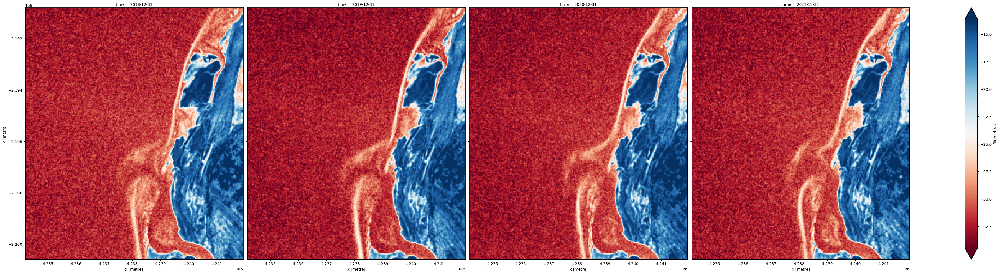

In [18]:
# Plot vh
ds_summaries_s1.filtered_vh.plot(
                        col='time',
                       cmap='RdBu',
                       col_wrap=4,
                       robust=True, size=10)
plt.show()

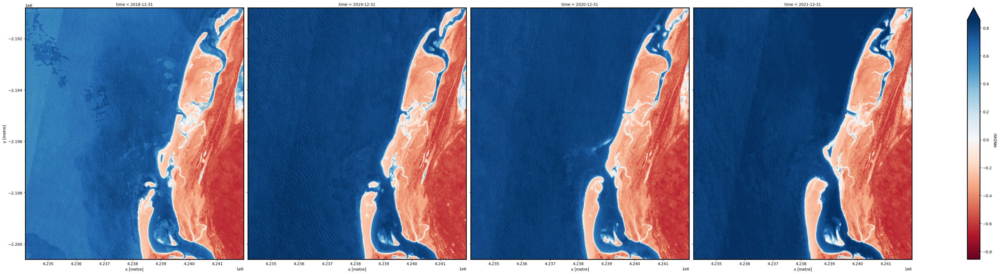

In [19]:
# Plot Sentinel-2
ds_summaries_s2.MNDWI.plot(
                        col='time',
                       cmap='RdBu',
                       col_wrap=4,
                       robust=True, size=10)
plt.show()

### Automatic thresholding of Sentinel-1 data (for comparison with supervised method)

In [20]:
# minimum thresholding
threshold = threshold_minimum(ds_summaries_s1.filtered_vh.values[~np.isnan(ds_summaries_s1.filtered_vh.values)])
# otsu thresholding
threshold_o = threshold_otsu(ds_summaries_s1.filtered_vh.values[~np.isnan(ds_summaries_s1.filtered_vh.values)])
print('threshold identified by minimum thresholding method: ',threshold)
print('threshold identified by otsu thresholding method: ', threshold_o)

threshold identified by minimum thresholding method:  -23.402588
threshold identified by otsu thresholding method:  -24.172955


## Apply the classification model

### Load the model

In [21]:
with open ('rf_model_Madagarscar_west', 'rb') as file:
    rf = pickle.load(file)

### Predict each year

In [22]:
# Rename each image by year
ds_summaries_s1['time'] = ds_summaries_s1.time.dt.year
ds_summaries_s1 = ds_summaries_s1.rename(time='year')

In [23]:
# apply to each year
predicted=[]
for i in range(ds_summaries_s1.dims['year']):
    ds_s1_year=ds_summaries_s1.isel(year=i)
    predicted_year = predict_xr(rf,ds_s1_year,proba=True,persist=False,clean=True).assign_coords(year=ds_s1_year.year.values).expand_dims('year')
    predicted.append(predicted_year)
predicted=xr.concat(predicted,dim='year')
print(predicted)

predicting...
   probabilities...
predicting...
   probabilities...
predicting...
   probabilities...
predicting...
   probabilities...
<xarray.Dataset>
Dimensions:        (x: 387, y: 489, year: 4)
Coordinates:
  * x              (x) float64 4.234e+06 4.234e+06 ... 4.242e+06 4.242e+06
  * y              (y) float64 -2.191e+06 -2.191e+06 ... -2.201e+06 -2.201e+06
    spatial_ref    int32 6933
  * year           (year) int64 2018 2019 2020 2021
Data variables:
    Predictions    (year, y, x) float64 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    Probabilities  (year, y, x) float64 51.0 51.5 56.0 50.5 ... 56.0 55.0 54.0
Attributes:
    grid_mapping:  spatial_ref


### Plot predictions and probabilities

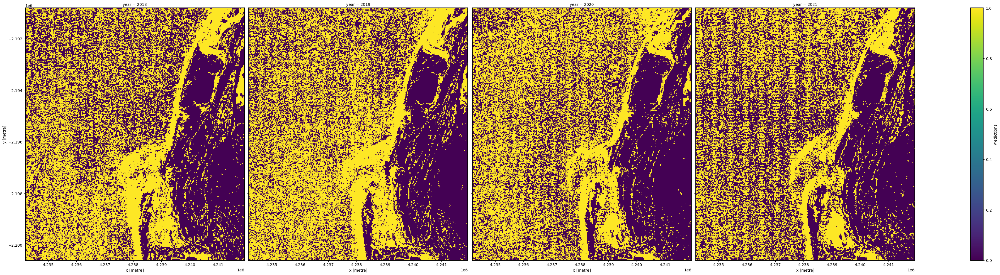

In [24]:
predicted.Predictions.plot(col='year',
                           cmap='viridis',
                           col_wrap=4,
                           robust=True, 
                           size=10)

## Extract shorelines from probabilities

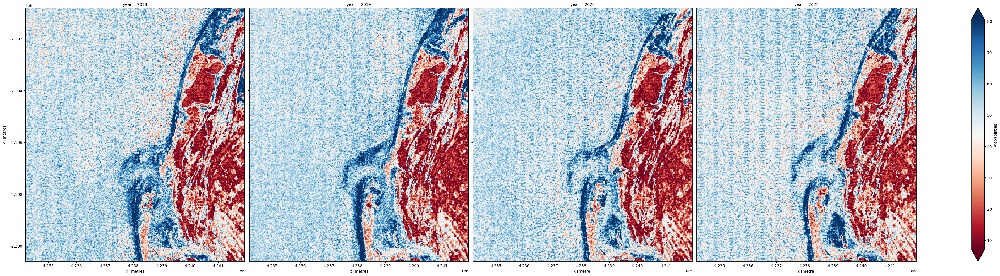

In [25]:
# covert the overall classification probabilities to water probabilities
predicted['Probabilities']=predicted.Probabilities.where(predicted.Predictions==1,100-predicted.Probabilities)
predicted.Probabilities.plot(col='year',
                           cmap='RdBu',
                           col_wrap=4,
                           robust=True, 
                           size=10)

In [26]:
# Extract waterline contours for the '0.5' probability:
contour_gdf = subpixel_contours(da=predicted.Probabilities,
                                z_values=60,
                                dim='year',
                                crs=predicted.geobox.crs,
                                output_path=f'annual_shorelines_S1_supervised.geojson',
                                min_vertices=15).set_index('year')

Operating in single z-value, multiple arrays mode
Writing contours to annual_shorelines_S1_supervised.geojson


### Extract shorelines through automatic thresholding (for comparison)

In [27]:
contour_gdf_thresholding=subpixel_contours(da=ds_summaries_s1.filtered_vh,
                                z_values=threshold,
                                dim='year',
                                crs=predicted.geobox.crs,
                                output_path=f'annual_shorelines_S1_thresholding.geojson',
                                min_vertices=15).set_index('year')

Operating in single z-value, multiple arrays mode
Writing contours to annual_shorelines_S1_thresholding.geojson


### Plot annual shorelines on an interactive map

In [28]:
# Plot shorelines on interactive map
contour_gdf.reset_index().explore(
    column='year',
    cmap='inferno',
    tiles=
    'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='ESRI WorldImagery')

In [29]:
contour_gdf_thresholding.reset_index().explore(
    column='year',
    cmap='inferno',
    tiles=
    'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='ESRI WorldImagery')